In [6]:
tech_colors= {
    'Transmission lines': "grey",
    'Battery storage' : '#80c944' ,
        'battery charger' : 'darkgreen' ,
    'battery discharger' : 'darkgreen' , 
    'battery' : 'darkgreen' ,        
    'Utility battery' : '#80c944' ,        
    'Home battery storage' : '#ace37f'  ,
    'Distributed battery' : '#ace37f'  ,
    'home battery charger' : '#ace37f'  ,
    'home battery discharger' : '#ace37f' ,    
    'home battery' : '#ace37f' ,    
    'H2 Fuel Cell': '#c251ae',
    'H2 Electrolysis': '#ff29d9',
    'H2 pipeline' : 'plum',
    'SMR': '#870c71',
    'SMR CC': '#4f1745',
    'Sabatier' : '#4f1745',
    'helmeth' : '#4f1745',
    'co2':'linen',
    'co2 vent':'linen',
    'co2 stored':'linen',
    'Electricity distribution grid': 'darkgrey',
    'electricity distribution grid': 'darkgrey',
    'distribution grid': 'darkgrey',
    'uranium': '#ff8c00',
    "onwind": "#235ebc",
    "Onshore wind": "#235ebc",
    "onshore wind": "#235ebc",
    'offwind': "#6895dd",
    'offwind-ac': "#6895dd",
    'Offshore wind': "#6895dd",
    'offshore wind': "#6895dd",
    'offshore wind ac': "#6895dd",
    'offwind-dc': "#74c6f2",
    'offshore wind dc': "#74c6f2",
    "Hydroelectricity": "#08ad97",
    "hydro": "#08ad97",
    "hydro+PHS": "#08ad97",
    "PHS": "#08ad97",
    "Pumped hydro storage": "teal",
    "hydro reservoir": "#08ad97",
    'hydroelectricity': '#08ad97',
    "ror": "#4adbc8",
    "Run of river": "#4adbc8",
    'Solar': "#f9d002",
    'Solar utility': "#f9d002",
    'solar utility': "#f9d002",
    'solar': "#f9d002",
    'solar PV': "#f9d002",
    'Solar rooftop' : 'orange',
    'solar rooftop' : 'orange',
    'Solar distributed' : 'orange',
    'solar distributed' : 'orange',
    'solar thermal': '#ffef60',
    'biomass': 'lime', #'#0c6013',
    'solid biomass': '#06540d',
    'biogas': '#23932d',
    'waste': '#68896b',
    'geothermal': '#ba91b1',
    "OCGT": "#d35050",
    "gas": "#d35050",
        "CCGT": "#d35050",
    "natural gas": "#d35050",
    "CCGT": "#b20101",
    "Nuclear": "rosybrown",
        "nuclear": "rosybrown",
    "coal": "#707070",
    "lignite": "#9e5a01",
    "oil": "#262626",
    "H2 storage": "#ea048a",
    "hydrogen storage": "#ea048a",
    "battery": "#b8ea04",
    "Electric load": "#f9d002",
    "electricity": "#f9d002",
    "lines": "#70af1d",
    "transmission lines": "#70af1d",
    "AC-AC": "#70af1d",
    "AC line": "#70af1d",
    "links": "#8a1caf",
    "HVDC links": "#8a1caf",
    "DC-DC": "#8a1caf",
    "DC link": "#8a1caf",
    'Solar thermal': '#ffef60',
    "Oil and gas to power/heat": "#d35050",
    "Coal": "#707070",
    "Power to liquid": '#4f1745',
    "Power to gas":'#870c71',
    "Power to heat":'maroon',
    "Biomass":'#06540d',
    "Biogas":'#23932d',
    "BEV charger":'rebeccapurple',
    "V2G":'mediumpurple',
    "DAC":'lightcoral',
    "Heat storage":"brown",
     "gas CHP": "orangered",
     "biomass CHP": "darkolivegreen",
     "resistive heater": "indianred",
     "air heat pump": "chocolate",
     "ground heat pump": "sandybrown",
    "Heat storage":"brown",
    "heat pump":'darkslategrey',
    "resistive heater":'maroon',
    "gas boiler": "crimson", 
    "industry": 'black',
    "Fischer-Tropsch":"darkgrey",

}

In [7]:
opt_name = {
    "Store": "e",
    "Line": "s",
    "Transformer": "s"
}
def calculate_costs(n, label, costs):

    for c in n.iterate_components(n.branch_components|n.controllable_one_port_components^{"Load"}):
        capital_costs = c.df.capital_cost*c.df[opt_name.get(c.name,"p") + "_nom_opt"]
        capital_costs_grouped = capital_costs.groupby(c.df.carrier).sum()

        capital_costs_grouped = pd.concat([capital_costs_grouped], keys=["capital"])
        capital_costs_grouped = pd.concat([capital_costs_grouped], keys=[c.list_name])

        costs = costs.reindex(capital_costs_grouped.index.union(costs.index))

        costs.loc[capital_costs_grouped.index, label] = capital_costs_grouped

        if c.name == "Link":
            p = c.pnl.p0.multiply(n.snapshot_weightings.generators, axis=0).sum()
        elif c.name == "Line":
            continue
        elif c.name == "StorageUnit":
            p_all = c.pnl.p.multiply(n.snapshot_weightings.generators, axis=0)
            p_all[p_all < 0.] = 0.
            p = p_all.sum()
        else:
            p = c.pnl.p.multiply(n.snapshot_weightings.generators, axis=0).sum()

        #correct sequestration cost
        if c.name == "Store":
            items = c.df.index[(c.df.carrier == "co2 stored") & (c.df.marginal_cost <= -100.)]
            c.df.loc[items, "marginal_cost"] = -20.

        marginal_costs = p*c.df.marginal_cost

        marginal_costs_grouped = marginal_costs.groupby(c.df.carrier).sum()

        marginal_costs_grouped = pd.concat([marginal_costs_grouped], keys=["marginal"])
        marginal_costs_grouped = pd.concat([marginal_costs_grouped], keys=[c.list_name])

        costs = costs.reindex(marginal_costs_grouped.index.union(costs.index))

        costs.loc[marginal_costs_grouped.index,label] = marginal_costs_grouped

    # add back in all hydro
    #costs.loc[("storage_units", "capital", "hydro"),label] = (0.01)*2e6*n.storage_units.loc[n.storage_units.group=="hydro", "p_nom"].sum()
    #costs.loc[("storage_units", "capital", "PHS"),label] = (0.01)*2e6*n.storage_units.loc[n.storage_units.group=="PHS", "p_nom"].sum()
    #costs.loc[("generators", "capital", "ror"),label] = (0.02)*3e6*n.generators.loc[n.generators.group=="ror", "p_nom"].sum()

    return costs

In [8]:
import pandas as pd
import numpy as np
import pypsa
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches


"""
scenarios= {'electricity_sector_only_181_newbase': 'postnetworks/elec_s_181_lv{}__Co2L0-2H-solar+p3-dist1_{}.nc' #Base : 500 €/kW distribution link cost, 0% loss
            ,'electricity_sector_only_181_newbase_norooftop': 'postnetworks/elec_s_181_lv{}__Co2L0-2H-solar+p3-dist1_{}.nc' #no rooftop and no home batteries
            ,'electricity_sector_only_181_newbase_highloss': 'postnetworks/elec_s_181_lv{}__Co2L0-2H-solar+p3-dist2_{}.nc'  #Base with added costs/losses : 1000 €/kW distribution link cost, 10% loss
           , 'electricity_sector_only_181_newbase_highloss_norooftop': 'postnetworks/elec_s_181_lv{}__Co2L0-2H-solar+p3-dist2_{}.nc' #no rooftop and no home batteries 
           , 'sector_coupling_181_newbase_highloss_noroofotp': 'postnetworks/elec_s_181_lv{}__Co2L0-2H-T-H-B-I-solar+p3-dist2_{}.nc' #no rooftop and no home batteries  
           ,'sector_coupling_181_newbase_highloss': 'postnetworks/elec_s_181_lv{}__Co2L0-2H-T-H-B-I-solar+p3-dist2_{}.nc'  #sector-coupled with added costs/losses : 1000 €/kW distribution link cost, 10% loss
           
           } 
"""

main_scen={'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist1{}-higheff_2030.nc':['','-nohomegen'],
          'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2{}_2030.nc':['-nohomegen',''],
          'Stable-sector-coupled/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist2-noH2network{}_2030.nc':['-nohomegen',''],
          'Stable-sector-coupled/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist2-noH2network{}-highrooftop6_2030.nc':['-nohomegen',''],
          }
scenarios_description= {'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist1-nohomegen-higheff_2030.nc':
                        ['Electricity sector', 'without distributed generation', 'Base distribution grid','A']  ,
            'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist1-higheff_2030.nc':
                        ['Electricity sector', 'with distributed generation', 'Base distribution grid','A']  ,
                        'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc':
                        ['Electricity sector', 'without distributed generation', 'With higher distribution cost/loss','B']  ,
                        'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':
                        ['Electricity sector', 'with distributed generation', 'With higher distribution cost/loss','B'] ,
                'sector_coupled_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist2-noH2network_2030.nc':
                        ['Sector coupled', 'with distributed generation', 'With higher distribution cost/loss','C'] ,
        'Stable-sector-coupled/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist2-noH2network-nohomegen_2030.nc':
                       ['Sector coupled', 'without distributed generation', 'With higher distribution cost/loss','C'] ,
             'Stable-sector-coupled/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist2-noH2network_2030.nc':
                             ['Sector coupled', 'with distributed generation', 'With higher distribution cost/loss, ','C'] ,
                       } 


transmission_expansion=[1.0] #,'opt']
years = [2030] 





In [19]:
from pypsa.plot import projected_area_factor
from matplotlib.patches import Circle, Ellipse, Patch
from matplotlib.legend_handler import HandlerPatch
from matplotlib.lines import Line2D

class HandlerCircle(HandlerPatch):
    """
    Legend Handler used to create circles for legend entries.

    This handler resizes the circles in order to match the same dimensional
    scaling as in the applied axis.
    """

    def create_artists(
        self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans
    ):
        fig = legend.get_figure()
        ax = legend.axes

        unit = np.diff(ax.transData.transform([(0, 0), (1, 1)]), axis=0)[0][1]
        radius = orig_handle.get_radius() * unit * (72 / fig.dpi)
        center = 5 - xdescent, 3 - ydescent
        p = plt.Circle(center, radius)
        self.update_prop(p, orig_handle, legend)
        p.set_transform(trans)
        return [p]


def make_legend_circles_for(sizes, scale=1.0, **kw):
    return [Circle((0, 0), radius=(s / scale)**0.5, **kw) for s in sizes]

def add_legend_circles(
    ax, sizes, labels, scale=1, srid=None, patch_kw={}, legend_kw={}
):

    if srid is not None:
        area_correction = projected_area_factor(ax, n.srid) ** 2
        sizes = [s * area_correction for s in sizes]

    handles = make_legend_circles_for(sizes, scale, **patch_kw)

    legend = ax.legend(
        handles, labels, handler_map={Circle: HandlerCircle()}, **legend_kw
    )

    ax.add_artist(legend)


def add_legend_lines(ax, sizes, labels, scale=1, patch_kw={}, legend_kw={}):

    handles = [Line2D([0], [0], linewidth=s / scale, **patch_kw) for s in sizes]

    legend = ax.legend(handles, labels, **legend_kw)

    ax.add_artist(legend)


def add_legend_patch(ax, colors, labels, patch_kw={}, legend_kw={}):

    handles = [Patch(facecolor=c, **patch_kw) for c in colors]

    legend = ax.legend(handles, labels, **legend_kw)

    ax.add_artist(legend)

/tmp/ipykernel_3273/1861811280.py:44: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  shares= pd.Series(index=pd.MultiIndex.from_product(iterables, names=["bus", "attribute"]))
/tmp/ipykernel_3273/1861811280.py:44: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  shares= pd.Series(index=pd.MultiIndex.from_product(iterables, names=["bus", "attribute"]))
/tmp/ipykernel_3273/1861811280.py:44: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  shares= pd.Series(index=pd.MultiIndex.from_product(iterables, names=["bus", "attribute"]))
/tmp/ipykernel_3273/1861811280.py:44: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64

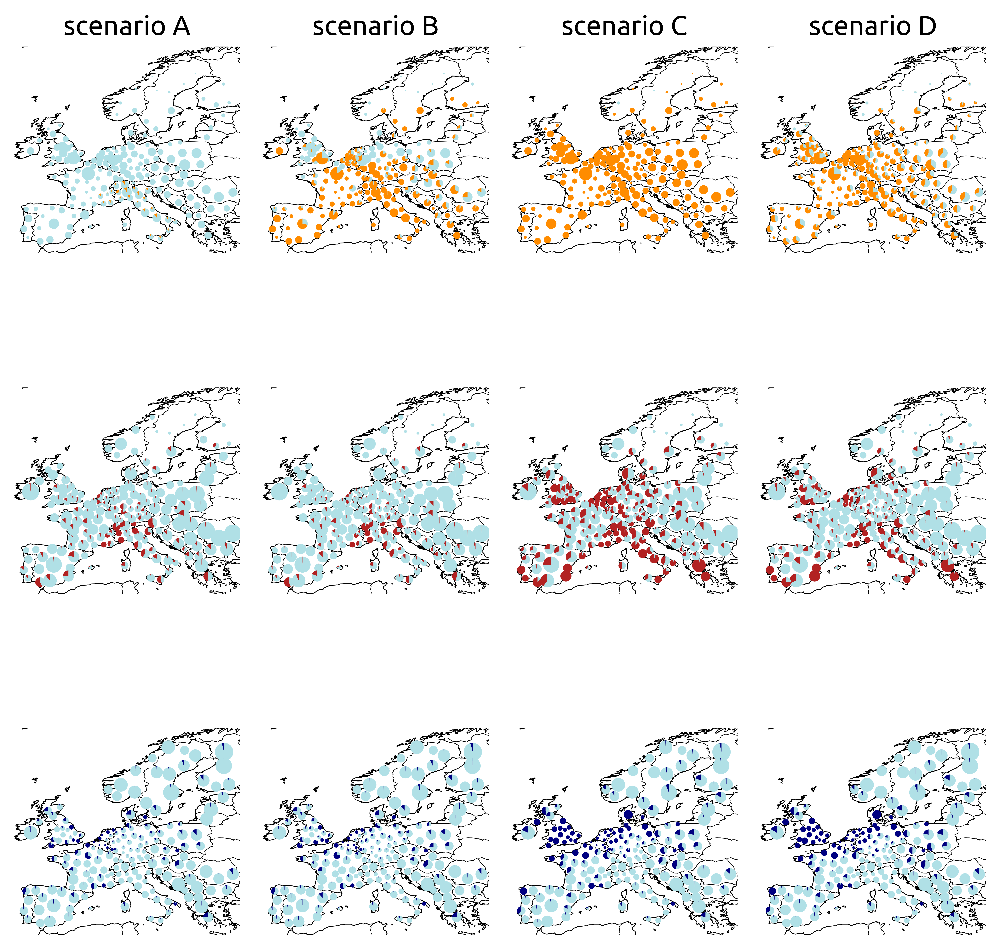

In [17]:
#figure S16

import cartopy.crs as ccrs
import cartopy
import geopandas as gpd
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)


plt.rcParams['figure.dpi'] = 1000
plt.rc('font',family='Ubuntu')
epsg = 3035
nodes = gpd.read_file('electricity_sector_only_181_newbase_highloss_noH2network/regions_onshore_elec_s_181.geojson').set_index("name")
nodes["Area"] = nodes.to_crs(epsg=epsg).area.div(1e6)
    

fig,axs = plt.subplots(3,4, figsize=(9,9) , subplot_kw={"projection":ccrs.PlateCarree()})   #or  ccrs.Orthographic() .Mercator
fig.subplots_adjust(wspace=0.1)


carriers = {'solar rooftop':['darkorange', 1e4], 'solar':['firebrick',1e5],'onwind': ['navy',1e5]}
line_width_factor=10           
main_scen={'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist1-higheff_2030.nc':['scenario A'],
          'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':['scenario B'],
          'Stable-sector-coupled/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist2-noH2network_2030.nc':['scenario C'],
          'Stable-sector-coupled/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist2-noH2network-highrooftop6_2030.nc':['scenario D'],
          }
base_color='powderblue'
for i, scen in enumerate(main_scen.keys()):
   n=pypsa.Network(scen)
   loading = (n.lines_t.p0.abs().mean().sort_index()/(n.lines.s_nom_opt*n.lines.s_max_pu).sort_index()).fillna(0.)    
 
   for j, carrier in enumerate(carriers.keys()):

     p_nom_opt = n.generators.p_nom_opt[[i for i in n.generators.index if n.generators.carrier[i]==carrier]]
     p_nom_opt= (p_nom_opt.groupby([n.generators.bus.map(n.buses.location)])
             .sum())
     p_nom_max= n.generators.p_nom_max[[i for i in n.generators.index if n.generators.carrier[i]==carrier]]
     p_nom_max= (p_nom_max.groupby([n.generators.bus.map(n.buses.location)])
             .sum())
        
     iterables = [p_nom_max.index, ["p_nom_opt", "p_nom_max"]]
     shares= pd.Series(index=pd.MultiIndex.from_product(iterables, names=["bus", "attribute"]))

     for ix in p_nom_max.index:
            shares[ix]["p_nom_max"]=(p_nom_max.loc[ix]-p_nom_opt.loc[ix]).clip(min=0)   ##to show share of installed vs. max
            shares[ix]["p_nom_opt"]=p_nom_opt.loc[ix]
            
     if i==3 and carrier=='solar rooftop':
        size=carriers[carrier][1]*6
     else:
        size=carriers[carrier][1]
        
     n.plot (ax=axs[j][i],
        bus_colors={'p_nom_max':base_color,'p_nom_opt':carriers[carrier][0]},
        branch_components=["Line"],
        line_widths=0,  #GW
        line_colors=loading,
        geomap=True,
        bus_sizes=shares/size 
            )#



     axs[j][i].axis('off')
     axs[j][i].set_extent([-10.53, 28.8, 35, 70])
     if j==0: axs[j][i].set_title(main_scen[scen][0], fontsize=14)

    
"""
     if i==0: 
       colors = [base_color,carriers[carrier][0]]
       labels=[i for i in [carrier+"\npotential", "installed\n"+carrier]]
       add_legend_patch(
        axs[j][i],
        colors,
        labels,
        patch_kw=dict(edgecolor="None"),
        legend_kw=dict(bbox_to_anchor=(-0.01, 1.05), ncol=1,fontsize=10,frameon=False),)
"""
    
plt.savefig("potential_maps.png", dpi=1000)    

# 20% co2 sensitivity

In [21]:
#figure S5
main_scen={'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2{}_2030.nc'
           :['-nohomegen','','$CO_{2}$ target: 95% reduction'],
          'Sensitivity-runs/postnetworks/elec_s_181_lv1.1__Co2L0p20-2H-solar+p3-dist2{}-noH2network_2030.nc'
           :['-nohomegen','','$CO_{2}$ target: 80% reduction'],}


results=pd.DataFrame({})
scen_costs={}
costs=pd.DataFrame({})   #empty ,TODO: change name

for scen in main_scen.keys():
    for i in range (2):
 #for tr_ex in transmission_expansion: 
    #for year in years:
             scenario = scen.format(main_scen[scen][i])
             n=pypsa.Network(scenario)
             result = pd.concat([pd.Series(n.links.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series(n.generators.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series({'Total-cost [bn€]' : n.objective/1e09})
                                ,pd.Series({'Peak load [GW]' : n.loads_t.p[[i for i in n.loads.index if 'electricity' in n.loads.carrier[i]]].sum(axis=1).max()/1e3})])
             results[scenario]=result.groupby(result.index).sum() 
                                       #'SMR', 'SMR CC','Sabatier','co2 vent','helmeth',
                                      #             'gas','H2 pipeline','uranium','coal' ,'lignite','oil',
                                       #            'DC'])  # 'ror','OCGT','H2 Electrolysis'
             scen_costs[scenario] = (calculate_costs(n,'capital+marginal',costs).sum(axis=1)).groupby(level=2).sum().div(1e9)  #in billiion Euros
             scen_costs[scenario] = scen_costs[scenario].rename(index={
                          'battery':'Battery storage','battery charger':'Battery storage','battery discharger':'Battery storage',
                          'home battery':'Home battery storage','home battery charger':'Home battery storage','home battery discharger':'Home battery storage',                                                       
                           'offwind-ac':'Offshore wind','offwind-dc':'Offshore wind', 'onwind':'Onshore wind',
                          'AC':'Transmission lines'  , 'DC':'Transmission lines','ror': 'Run of river',
                          'hydro':'Hydroelectricity' , 'nuclear':'Nuclear','uranium':'Nuclear',
                          'solar':'Solar utility', 'solar rooftop':'Solar distributed',
                          'electricity distribution grid' : 'Electricity distribution grid',
                           'PHS' : 'Pumped hydro storage', 'H2':'H2 storage',
                           'SMR':'Power to gas'  , 'SMR CC':'Power to gas','oil': 'Oil and gas to power/heat',
                           'Fischer-Tropsch':'Power to liquid', 
                           'Sabatier':'Power to gas', 'helmeth':'Power to gas', 'coal' : 'Coal', 'lignite' :'Coal',
                          })  # co2 vent','co2','co2 stored',
             for ix in scen_costs[scenario].index :   
                if 'resistive heater' in ix or 'heat pump' in ix :
                    scen_costs[scenario] =scen_costs[scenario].rename(index={ix : 'Power to heat',})
                if  any(w in ix for w in ['gas', 'OCGT', 'CCGT'])  :
                    scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Oil and gas to power/heat',})
                if 'biomass' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Biomass',})
                if 'solar thermal' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Solar thermal',})
                if 'water tank' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Heat storage',})
                if 'biogas' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Biogas',})
                #if 'biogas' in ix :scen_costs[scenario].rename(index={ix:'Biomass',})
                    
             scen_costs[scenario]=scen_costs[scenario].groupby(scen_costs[scenario].index).sum() 
            
costs=pd.DataFrame({})

preferred_order = pd.Index(
    [
        "Transmission lines",
        "Electricity distribution grid",
        "Oil and gas to power/heat",
        "Coal",
        "Power to liquid",
        "Power to gas",
        "Biomass",
        "Biogas",
        "BEV charger",
        "V2G",
        "DAC",
        "Power to heat",
        "Heat storage",
        "H2 storage",
        "H2 pipeline",
        "H2 Electrolysis",
        "H2 Fuel Cell",
        "Pumped hydro storage",
        "Hydroelectricity",
        "Run of river",
        "Nuclear",
        "Onshore wind",
        "Offshore wind",
        "Battery storage",
        "Home battery storage",
        "Solar thermal",
        "Solar utility",
        "Solar rooftop",
    ]
)


for  scenario in reversed(scen_costs.keys()) :
    costs[scenario]=pd.DataFrame(scen_costs[scenario].drop(labels =['co2 vent','co2','co2 stored'
                                                                   ]))
                                                                  #  ,'oil','uranium','lignite','coal','gas' ]) ) 
                                                        #   ['SMR', 'SMR CC','Sabatier','co2 vent','co2','co2 stored',
                                                   #    'helmeth', 'oil','uranium','lignite','coal','gas', 'CCGT','OCGT'
                                                  #  ]) ) #dropping all the variables not visible in figure
    

order = preferred_order.intersection(costs[scenario].index).append(
        costs[scenario].index.difference(preferred_order))    
costs=costs.reindex(order)   
#costs=costs.drop(labels =['process emissions','process emissions CC','Li ion'])
costs=costs.fillna(0)
results=results.fillna(0)            

INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p20-2H-solar+p3-dist2-nohomegen-noH2network_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p20-2H-solar+p3-dist2-noH2network_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


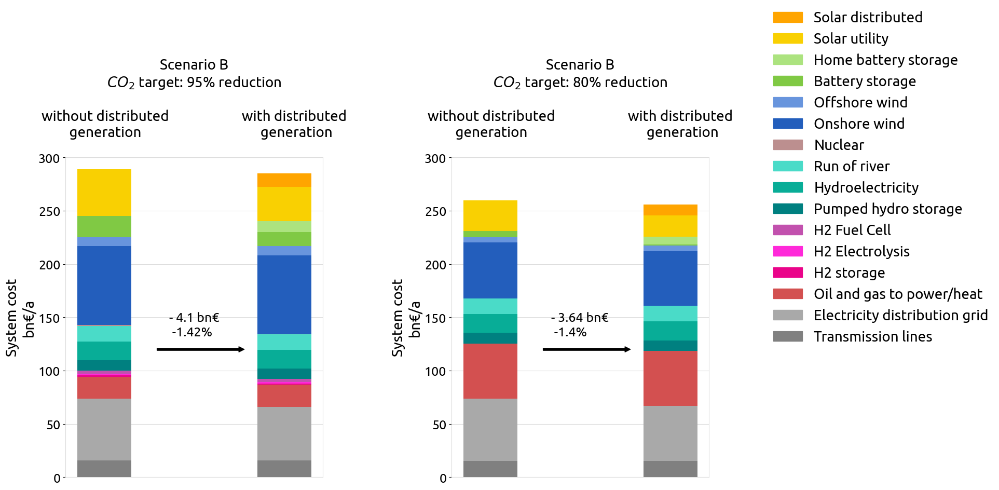

In [25]:
from matplotlib.patches import FancyArrowPatch
import matplotlib.font_manager

plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')
#plt.rcParams['figure.dpi'] = 1000


fig, axs = plt.subplots(1, 2, figsize=(16,8)) #, sharey=True)
fig.subplots_adjust(hspace=0.5)
fig.subplots_adjust(wspace=0.5)

bar_width=0.3
index=np.arange(4) 


for i,base in enumerate(main_scen.keys()):
    for j, category in enumerate(main_scen[base][0:2]):
            scenario=base.format(category) 
            bottom=0
            axs[i].grid(axis = 'y',color='gainsboro', zorder=0)
            for color, component in enumerate(costs[scenario].index):
                axs[i].bar(index[j], costs[scenario][component] , bar_width, bottom=bottom,
                           color=tech_colors[component], zorder=3)
                bottom+=costs[scenario][component]
            axs[i].set_xlabel("", rotation=0)
            axs[i].set_xticks([], [])
            axs[i].tick_params(axis='y', labelsize=18)
            #axs[i].set_facecolor("whitesmoke")
            #axs[i].set_yticks(np.arange(0, 401, 100),fontsize=25)
            axs[i].set_title('Scenario B\n'+main_scen[base][2]+'\n\nwithout distributed                      with distributed\n    generation                                    generation\n',fontsize=20, fontname = 'Ubuntu')
            axs[i].set_ylabel('System cost\n'+'bn€/a',fontsize=20, fontname = 'Ubuntu')
            
legend_manual=[]
for key in (costs[scenario].index):
  if key != 'V2G' and key != 'BEV charger' and key != 'Coal' :
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key))
plt.legend(handles=legend_manual[::-1],loc='upper left', bbox_to_anchor=(1.2, 1.5),ncol=1,
           fontsize=20,frameon=False)

for i ,scen in enumerate (main_scen.keys()):
    fig.text(0.46*(i)+0.25, 0.45, "- "+str(round(scen_costs[scen.format(main_scen[scen][0])].sum()-
                                              scen_costs[scen.format(main_scen[scen][1])].sum(),2))
         +" bn€\n "+str(round(100*((scen_costs[scen.format(main_scen[scen][1])].sum()/
                                     scen_costs[scen.format(main_scen[scen][0])].sum())-1),2))+"%", 
         fontsize=18)

def add_arrow(ax0, ax1, pos0, pos1, **arrow_kwargs):
    ax0tr = ax0.transData  # Axis 0 -> Display
    ax1tr = ax1.transData  # Axis 1 -> Display
    figtr = fig.transFigure.inverted()  # Display -> Figure
    ptB = figtr.transform(ax0tr.transform(pos0))
    ptE = figtr.transform(ax1tr.transform(pos1))
    arrow = FancyArrowPatch(
        ptB,
        ptE,
        transform=fig.transFigure,  # Place arrow in figure coord system
        **arrow_kwargs,
    )
    fig.patches.append(arrow)


arrow_style = dict(arrowstyle="simple", mutation_scale=15, ec=None)
add_arrow(axs[0], axs[0], (0.35, 0.4), (0.7, 0.4), fc="black", **arrow_style)
add_arrow(axs[1], axs[1], (0.35, 0.4), (0.7, 0.4), fc="black", **arrow_style)
#add_arrow(axs[2], axs[2], (0.4, 0.5), (0.7, 0.5), fc="black", **arrow_style)

axs[0].set_yticks(np.arange(0, 301, 50),fontsize=25)
axs[1].set_yticks(np.arange(0, 301, 50),fontsize=25)
#axs[2].set_yticks(np.arange(0, 851, 170),fontsize=25)


In [9]:
# figure S4
main_scen={
           'Sensitivity-runs/postnetworks/elec_s_181_lv1.1__Co2L0p05-1H-solar+p3-dist2-noH2network{}_2030.nc'
           :['-nohomegen','','1-hr timesteps'],
            'Sensitivity-runs/postnetworks/elec_s_181_lv1.1__Co2L0p05-3H-solar+p3-dist2-noH2network{}_2030.nc'
           :['-nohomegen','','3-hr timesteps'],
            'Sensitivity-runs/postnetworks/elec_s_181_lv1.1__Co2L0p05-6H-solar+p3-dist2-noH2network{}_2030.nc'
           :['-nohomegen','','6-hr timesteps'],}


results=pd.DataFrame({})
scen_costs={}
costs=pd.DataFrame({})   #empty ,TODO: change name

for scen in main_scen.keys():
    for i in range (2):
 #for tr_ex in transmission_expansion: 
    #for year in years:
             scenario = scen.format(main_scen[scen][i])
             n=pypsa.Network(scenario)
             result = pd.concat([pd.Series(n.links.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series(n.generators.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series({'Total-cost [bn€]' : n.objective/1e09})
                                ,pd.Series({'Peak load [GW]' : n.loads_t.p[[i for i in n.loads.index if 'electricity' in n.loads.carrier[i]]].sum(axis=1).max()/1e3})])
             results[scenario]=result.groupby(result.index).sum() 
                                       #'SMR', 'SMR CC','Sabatier','co2 vent','helmeth',
                                      #             'gas','H2 pipeline','uranium','coal' ,'lignite','oil',
                                       #            'DC'])  # 'ror','OCGT','H2 Electrolysis'
             scen_costs[scenario] = (calculate_costs(n,'capital+marginal',costs).sum(axis=1)).groupby(level=2).sum().div(1e9)  #in billiion Euros
             scen_costs[scenario] = scen_costs[scenario].rename(index={
                          'battery':'Battery storage','battery charger':'Battery storage','battery discharger':'Battery storage',
                          'home battery':'Home battery storage','home battery charger':'Home battery storage','home battery discharger':'Home battery storage',                                                       
                           'offwind-ac':'Offshore wind','offwind-dc':'Offshore wind', 'onwind':'Onshore wind',
                          'AC':'Transmission lines'  , 'DC':'Transmission lines','ror': 'Run of river',
                          'hydro':'Hydroelectricity' , 'nuclear':'Nuclear','uranium':'Nuclear',
                          'solar':'Solar utility', 'solar rooftop':'Solar distributed',
                          'electricity distribution grid' : 'Electricity distribution grid',
                           'PHS' : 'Pumped hydro storage', 'H2':'H2 storage',
                           'SMR':'Power to gas'  , 'SMR CC':'Power to gas','oil': 'Oil and gas to power/heat',
                           'Fischer-Tropsch':'Power to liquid', 
                           'Sabatier':'Power to gas', 'helmeth':'Power to gas', 'coal' : 'Coal', 'lignite' :'Coal',
                          })  # co2 vent','co2','co2 stored',
             for ix in scen_costs[scenario].index :   
                if 'resistive heater' in ix or 'heat pump' in ix :
                    scen_costs[scenario] =scen_costs[scenario].rename(index={ix : 'Power to heat',})
                if  any(w in ix for w in ['gas', 'OCGT', 'CCGT'])  :
                    scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Oil and gas to power/heat',})
                if 'biomass' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Biomass',})
                if 'solar thermal' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Solar thermal',})
                if 'water tank' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Heat storage',})
                if 'biogas' in ix :scen_costs[scenario] =scen_costs[scenario].rename(index={ix:'Biogas',})
                #if 'biogas' in ix :scen_costs[scenario].rename(index={ix:'Biomass',})
                    
             scen_costs[scenario]=scen_costs[scenario].groupby(scen_costs[scenario].index).sum() 
            
costs=pd.DataFrame({})

preferred_order = pd.Index(
    [
        "Transmission lines",
        "Electricity distribution grid",
        "Oil and gas to power/heat",
        "Coal",
        "Power to liquid",
        "Power to gas",
        "Biomass",
        "Biogas",
        "BEV charger",
        "V2G",
        "DAC",
        "Power to heat",
        "Heat storage",
        "H2 storage",
        "H2 pipeline",
        "H2 Electrolysis",
        "H2 Fuel Cell",
        "Pumped hydro storage",
        "Hydroelectricity",
        "Run of river",
        "Nuclear",
        "Onshore wind",
        "Offshore wind",
        "Battery storage",
        "Home battery storage",
        "Solar thermal",
        "Solar utility",
        "Solar rooftop",
    ]
)


for  scenario in reversed(scen_costs.keys()) :
    costs[scenario]=pd.DataFrame(scen_costs[scenario].drop(labels =['co2 vent','co2','co2 stored'
                                                                   ]))
                                                                  #  ,'oil','uranium','lignite','coal','gas' ]) ) 
                                                        #   ['SMR', 'SMR CC','Sabatier','co2 vent','co2','co2 stored',
                                                   #    'helmeth', 'oil','uranium','lignite','coal','gas', 'CCGT','OCGT'
                                                  #  ]) ) #dropping all the variables not visible in figure
    

order = preferred_order.intersection(costs[scenario].index).append(
        costs[scenario].index.difference(preferred_order))    
costs=costs.reindex(order)   
#costs=costs.drop(labels =['process emissions','process emissions CC','Li ion'])
costs=costs.fillna(0)
results=results.fillna(0)            

INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-1H-solar+p3-dist2-noH2network-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-1H-solar+p3-dist2-noH2network_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-3H-solar+p3-dist2-noH2network-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-3H-solar+p3-dist2-noH2network_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-6H-solar+p3-dist2-noH2network-nohomegen_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa

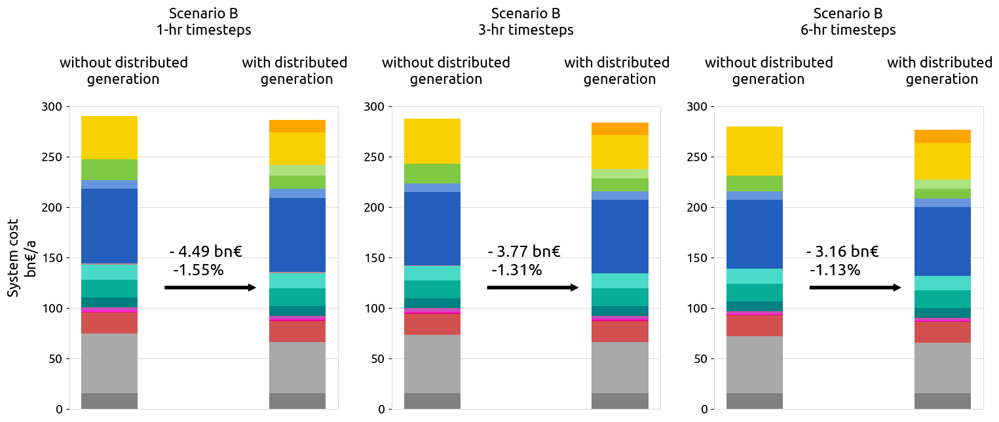

In [10]:
from matplotlib.patches import FancyArrowPatch
import matplotlib.font_manager

plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')
#plt.rcParams['figure.dpi'] = 1000


fig, axs = plt.subplots(1, 3, figsize=(18,6)) #, sharey=True)
fig.subplots_adjust(hspace=0.1)
fig.subplots_adjust(wspace=0.2)

bar_width=0.3
index=np.arange(4) 


for i,base in enumerate(main_scen.keys()):
    for j, category in enumerate(main_scen[base][0:2]):
            scenario=base.format(category) 
            bottom=0
            axs[i].grid(axis = 'y',color='gainsboro', zorder=0)
            for color, component in enumerate(costs[scenario].index):
                axs[i].bar(index[j], costs[scenario][component] , bar_width, bottom=bottom,
                           color=tech_colors[component], zorder=3)
                bottom+=costs[scenario][component]
            axs[i].set_xlabel("", rotation=0)
            axs[i].set_xticks([], [])
            axs[i].tick_params(axis='y', labelsize=14)
            #axs[i].set_facecolor("whitesmoke")
            #axs[i].set_yticks(np.arange(0, 401, 100),fontsize=25)
            axs[i].set_title('Scenario B\n'+main_scen[base][2]+'\n\nwithout distributed                with distributed\n    generation                              generation\n',fontsize=16, fontname = 'Ubuntu')
            if i==0: axs[i].set_ylabel('System cost\n'+'bn€/a',fontsize=16, fontname = 'Ubuntu')
            
legend_manual=[]
for key in (costs[scenario].index):
  if key != 'V2G' and key != 'BEV charger' and key != 'Coal' :
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key))
#plt.legend(handles=legend_manual[::-1],loc='upper left', bbox_to_anchor=(1.2, 1.1),ncol=1,
 #          fontsize=20,frameon=False)

for i ,scen in enumerate (main_scen.keys()):
    fig.text(0.27*(i)+0.21, 0.45, "- "+str(round(scen_costs[scen.format(main_scen[scen][0])].sum()-
                                              scen_costs[scen.format(main_scen[scen][1])].sum(),2))
         +" bn€\n "+str(round(100*((scen_costs[scen.format(main_scen[scen][1])].sum()/
                                     scen_costs[scen.format(main_scen[scen][0])].sum())-1),2))+"%", 
         fontsize=18)

def add_arrow(ax0, ax1, pos0, pos1, **arrow_kwargs):
    ax0tr = ax0.transData  # Axis 0 -> Display
    ax1tr = ax1.transData  # Axis 1 -> Display
    figtr = fig.transFigure.inverted()  # Display -> Figure
    ptB = figtr.transform(ax0tr.transform(pos0))
    ptE = figtr.transform(ax1tr.transform(pos1))
    arrow = FancyArrowPatch(
        ptB,
        ptE,
        transform=fig.transFigure,  # Place arrow in figure coord system
        **arrow_kwargs,
    )
    fig.patches.append(arrow)


arrow_style = dict(arrowstyle="simple", mutation_scale=15, ec=None)
add_arrow(axs[0], axs[0], (0.35, 0.4), (0.7, 0.4), fc="black", **arrow_style)
add_arrow(axs[1], axs[1], (0.35, 0.4), (0.7, 0.4), fc="black", **arrow_style)
add_arrow(axs[2], axs[2], (0.35, 0.4), (0.7, 0.4), fc="black", **arrow_style)

axs[0].set_yticks(np.arange(0, 301, 50),fontsize=25)
axs[1].set_yticks(np.arange(0, 301, 50),fontsize=25)
axs[2].set_yticks(np.arange(0, 301, 50),fontsize=25)


In [11]:
# figure S24
main_scen= {
    'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':'scenario B',
    'Sensitivity-runs/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-noH2network-cheapbattery_2030.nc':'scenario B with\nlower cost for\nbattery storage'}

results_test=pd.DataFrame({})
scen_costs={}
costs= pd.DataFrame({})
years=[2030]

for scenario in main_scen.keys():
             n=pypsa.Network(scenario)
             result = pd.concat([pd.Series(n.links.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series(n.generators.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series({'Total-cost' : n.objective/1e09})])
             results_test[scenario]=result#.drop(labels = ['SMR', 'SMR CC','Sabatier','co2 vent','helmeth',
                                           #        'gas','H2 pipeline','uranium','coal' ,'lignite','oil',
                                            #       'DC']) 
             scen_costs[scenario] = (calculate_costs(n,'capital+marginal',costs).sum(axis=1)).groupby(level=2).sum().div(1e9)  #in billiion Euros
           

INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2-noH2network-cheapbattery_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [12]:
import matplotlib.font_manager

plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['figure.dpi'] = 1000
plt.rcParams['hatch.linewidth'] = 1.5

fig, axs = plt.subplots(figsize=(10,5),sharex=True)
fig.subplots_adjust(hspace=0.5)
count=0
bottom=0
bar_width=0.4
hatches = ['', '//', '\\\\', 'xxx','\\\\','//', '\\\\', '||', '--', '++', 'xx', 'oo', 'OO', '..', '**']
results_=results_test.drop (labels=['Total-cost','CCGT','OCGT','H2 Fuel Cell','H2 Electrolysis',
                            'home battery charger', 'battery charger',
                           'offwind-ac','offwind-dc','ror','nuclear',
                            'SMR', 'SMR CC','Sabatier','co2 vent','helmeth',
                            'gas','uranium','coal' ,'lignite','oil',
                            'DC'])
index=np.arange(len(results_.index))

preferred_order = pd.Index(
    [
        "solar",
        "battery discharger",
        "solar rooftop",
        "home battery discharger",
        "electricity distribution grid",
        "onwind",
    ]
 )
results_=results_.reindex(preferred_order)   

for k,scenario in enumerate(main_scen.keys()):
    for m, component in enumerate(results_[scenario].index):
                axs.bar(index[m]+1*k*bar_width, results_[scenario][component]/1e3 , bar_width, 
                                edgecolor='white', hatch=hatches[k], bottom=bottom,
                           color=tech_colors[component], zorder=3)
    
    #axs.set_title('Sceneario B with distributed generation and storage' ,
     #                   fontsize=14)
    axs.tick_params(axis='y', labelsize=18)
    axs.set_ylabel("installed capacity [GW]",fontsize=18)
    axs.set_yticks(np.arange(0, 1001, 500),fontsize=18)
    
    count+=1
    
xlabels = ['Utility Solar', 'Utility battery','Distributed Solar', 'Home battery', 'Distribution grid','Onshore wind']
xlabels = [label.replace(' ', ' \n') for label in xlabels]
axs.set_xticks((index)++bar_width*0.5)    
axs.set_xticklabels(xlabels,fontsize=16, rotation=60,ha='right', rotation_mode='anchor')

legend_manual=[]
for i, key in enumerate(main_scen.keys()):
    legend_manual.append(mpatches.Patch(facecolor='whitesmoke', hatch=hatches[i], edgecolor='k', 
                                        label=main_scen[key]))
legend1=plt.legend(handles=legend_manual,loc='center right', bbox_to_anchor=(1.35, .75),ncol=1,
           fontsize=16, frameon=False) 
plt.gca().add_artist(legend1)

#legend_manual=[]
#for i,key in enumerate(results_[scenario].index):
#    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=xlabels[i]))
#plt.legend(handles=legend_manual[::],loc='upper left', bbox_to_anchor=(1, 0.6),ncol=1,
 #          fontsize=14,frameon=False)

plt.show() 

In [4]:
#figure S3

#sensitivity for spatial resolution

import pypsa
import openpyxl
import pandas as pd
import logging
#logger.setLevel(logging.INFO)

main_scen={'Sensitivity-runs/postnetworks/elec_s_37_lv1.1__Co2L0p05-2H-solar+p3-dist2-noH2network_2030.nc': ['37'],
            'electricity_sector_only_181_newbase_highloss_noH2network/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc':['181'],  
           'Sensitivity-runs/postnetworks/elec_s_256_lv1.1__Co2L0p05-2H-solar+p3-dist2-noH2network_2030.nc':['256'],
            'Sensitivity-runs/postnetworks/elec_s_512_lv1.1__Co2L0p05-2H-solar+p3-dist2-noH2network_2030.nc':['512'],
           }
### the second network has batteries, but no rooftop

results_test=pd.DataFrame({})
transmission_expansion= [1.0]
years=[2030]

for scenario in main_scen.keys():
             n=pypsa.Network(scenario)
             result = pd.concat([pd.Series(n.links.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series(n.generators.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series({'Total-cost' : n.objective/1e09})])
             results_test[scenario]=result#.drop(labels = ['SMR', 'SMR CC','Sabatier','co2 vent','helmeth',
                                           #        'gas','H2 pipeline','uranium','coal' ,'lignite','oil',
                                            #       'DC']) 

INFO:pypsa.io:Imported network elec_s_37_lv1.1__Co2L0p05-2H-solar+p3-dist2-noH2network_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-solar+p3-dist2_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_256_lv1.1__Co2L0p05-2H-solar+p3-dist2-noH2network_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_512_lv1.1__Co2L0p05-2H-solar+p3-dist2-noH2network_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


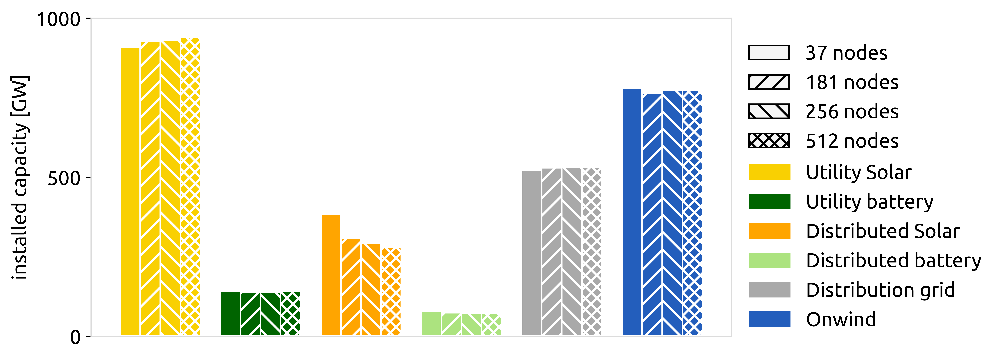

In [5]:
import matplotlib.font_manager

plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['figure.dpi'] = 1000
plt.rcParams['hatch.linewidth'] = 1.5

fig, axs = plt.subplots(figsize=(8,4),sharex=True)
fig.subplots_adjust(hspace=0.5)
count=0
bottom=0
bar_width=0.2
hatches = ['', '//', '\\\\', 'xxx','\\\\','//', '\\\\', '||', '--', '++', 'xx', 'oo', 'OO', '..', '**']
results_=results_test.drop (labels=['Total-cost','CCGT','OCGT','H2 Fuel Cell','H2 Electrolysis',
                            'home battery charger', 'battery charger',
                           'offwind-ac','offwind-dc','ror','nuclear',
                            'SMR', 'SMR CC','Sabatier','co2 vent','helmeth',
                            'gas','uranium','coal' ,'lignite','oil',
                            'DC'])
index=np.arange(len(results_.index))

preferred_order = pd.Index(
    [
        "solar",
        "battery discharger",
        "solar rooftop",
        "home battery discharger",
        "electricity distribution grid",
        "onwind",
    ]
 )
results_=results_.reindex(preferred_order)   

for k,scenario in enumerate(main_scen.keys()):
    for m, component in enumerate(results_[scenario].index):
                axs.bar(index[m]+1*k*bar_width, results_[scenario][component]/1e3 , bar_width, 
                                edgecolor='white', hatch=hatches[k], bottom=bottom,
                           color=tech_colors[component], zorder=3)
    
    #axs.set_title('Sceneario B with distributed generation and storage' ,
     #                   fontsize=14)
    axs.set_xlabel("", rotation=0)
    axs.set_xticks([], [])
    axs.tick_params(axis='y', labelsize=14)
    axs.set_ylabel("installed capacity [GW]",fontsize=14)
    axs.set_yticks(np.arange(0, 1001, 500),fontsize=20)
    
    count+=1
    
xlabels = ['Utility Solar', 'Utility battery','Distributed Solar', 'Distributed battery', 'Distribution grid','Onwind']

legend_manual=[]
for i, key in enumerate(main_scen.keys()):
    legend_manual.append(mpatches.Patch(facecolor='whitesmoke', hatch=hatches[i], edgecolor='k', 
                                        label=main_scen[key][0]+' nodes'))
legend1=plt.legend(handles=legend_manual,loc='center right', bbox_to_anchor=(1.29, .75),ncol=1,
           fontsize=14, frameon=False) 
plt.gca().add_artist(legend1)

legend_manual=[]
for i,key in enumerate(results_[scenario].index):
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=xlabels[i]))
plt.legend(handles=legend_manual[::],loc='upper left', bbox_to_anchor=(1, 0.6),ncol=1,
           fontsize=14,frameon=False)

plt.show() 

In [13]:
def get_generation(n, carriers=None):

    dispatch = n.generators_t.p 

    generators_gen = n.snapshot_weightings.generators @ (dispatch) #n.snapshot_weightings.generators

    generators_gen = (
        generators_gen.groupby([n.generators.bus.map(n.buses.location), n.generators.carrier])
        .sum()
        .unstack()
    )
    
    links_gen= (-1) *n.snapshot_weightings.generators @(n.links_t.p1)
    links_gen = (links_gen.groupby([n.links.bus1.map(n.buses.location), n.links.carrier])
        .sum()
        .unstack()
    )
    #for i in links_gen.index:
     #     if 'EU' not in i :  
      #          generation.loc[ ( i, "nuclear" ) ]=links_gen['nuclear'].loc[i]
    generation_ = [generators_gen, links_gen]
    generation = pd.concat(generation_)

    return generation.drop("EU", axis=0).div(1e6)  #.stack()



In [14]:
# figure S30
from matplotlib.patches import FancyArrowPatch
import matplotlib.font_manager

plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')
#plt.rcParams['figure.dpi'] = 1000


fig, axs = plt.subplots(figsize=(8,10)) #, sharey=True)
fig.subplots_adjust(hspace=0.07)
fig.subplots_adjust(wspace=0.5)

bar_width=0.3
index=np.arange(4) 

carriers = {
        "gas CHP": "Gas CHP",
        "biomass CHP": "Biomass CHP",
        "resistive heater": "Resistive heater",
        "air heat pump": "Air heat pump",
        "ground heat pump": "Ground heat pump",
        "gas boiler": "Gas boiler",        
        "solar thermal": "Solar thermal",

    }

types = [
         "decentral",
         "rural",
         "urban central",]

main_scen=[
          'Stable-sector-coupled/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist1-noH2network-higheff1_2030.nc',
          'Stable-sector-coupled/postnetworks/elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist2-noH2network_2030.nc']


for j, scenario in enumerate(main_scen):
            n=pypsa.Network(scenario)
            generation = get_generation(n)
            heat_sums=generation[[i for i in generation.columns if any(carrier in i for carrier in carriers.keys())]].sum()
            for ix in heat_sums.index :  
                for key in carriers.keys():
                    if key in ix :
                                heat_sums =heat_sums.rename(index={ix : key,})
            heat_sums=heat_sums.groupby(heat_sums.index).sum() 
            bottom=0
            axs.grid(axis = 'y',color='gainsboro', zorder=0)
            for color, component in enumerate(heat_sums.index):
                axs.bar(index[j], heat_sums[component] , bar_width, bottom=bottom, color=tech_colors[component],  #GWh
                            zorder=3)   #component
                bottom+=heat_sums[component]
            axs.set_xlabel("", rotation=0)
            axs.set_xticks([], [])
            axs.tick_params(axis='y', labelsize=18)
            #axs[i].set_facecolor("whitesmoke")
            #axs[i].set_yticks(np.arange(0, 401, 100),fontsize=25)
            axs.set_title('Scenario C\n 500 €/kW, 0 loss         1000€/kW, 10%loss\n\n',fontsize=20, fontname = 'Ubuntu')
            #if j==0 : axs[i].set_ylabel(scenarios_description[scenario][0]+'\n'+
             #   scenarios_description[scenario][2]+'\n\n'+'bn€/a',fontsize=20, fontname = 'Ubuntu')

                
legend_manual=[]
for key in (heat_sums.index):
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=key))
plt.legend(handles=legend_manual[::-1],loc='upper left', bbox_to_anchor=(1,1),ncol=1,
           fontsize=20,frameon=False)

##since the electricity distribution has higher power losses, the system moves towards direct heat sources

INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist1-noH2network-higheff1_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network elec_s_181_lv1.1__Co2L0p05-2H-T-H-B-I-solar+p3-dist2-noH2network_2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [ ]:
# figure S2
#difference for 181 nodes with 1 link / 2 link
import pandas as pd
import numpy as np
import pypsa
import matplotlib.pyplot as plt

Dist_factor =[1, 5] 


year=2030

bar_width=0.15
transmission_expansion=[1.0,'opt']
index=np.arange(4) 
colors=['yellow','gold']
results=pd.DataFrame({})

for i,dist_f in enumerate(Dist_factor):
  scenarios=[]  
  for j,tr_ex in enumerate(transmission_expansion):
    for k,linktype in enumerate(['only_181','twolink_181']):
             n=pypsa.Network('electricity_sector_{}/postnetworks/elec_s_181_lv{}__Co2L0-2H-solar+p3-dist{}_{}.nc'.format
              (linktype,tr_ex,dist_f,year))
             result = pd.concat([pd.Series(n.links.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series(n.generators.groupby("carrier").p_nom_opt.sum())
                                 ,pd.Series({'Total-cost' : n.objective/1e09})])
             results['dist:'+str(dist_f)+' tr_ex:'+str(tr_ex)+linktype]=result.drop(labels = ['SMR', 'SMR CC','Sabatier','co2 vent','helmeth',
                                                   'gas','H2 pipeline','uranium',
                                                   'DC']) 
            
          

In [ ]:
import matplotlib.font_manager

plt.rc('font',family='Ubuntu')
plt.rc('axes',edgecolor='gainsboro')
plt.rcParams['figure.dpi'] = 1000
plt.rcParams['hatch.linewidth'] = 1.5

fig, axs = plt.subplots(4, 1, figsize=(12,10),sharex=True)
fig.subplots_adjust(hspace=0.5)
count=0
bottom=0
bar_width=0.3
index=np.arange(len(results.index))
hatches = ['', '//', '****', 'xxx','\\\\','//', '\\\\', '||', '--', '++', 'xx', 'oo', 'OO', '..', '**']
results_=results.drop (labels=['Total-cost','CCGT','OCGT','H2 Fuel Cell','H2 Electrolysis',
                            'home battery charger', 'battery charger',
                           'offwind-ac','offwind-dc','ror','nuclear'])

preferred_order = pd.Index(
    [
        "solar",
        "battery discharger",
        "solar rooftop",
        "home battery discharger",
        "electricity distribution grid",
        "onwind",
    ]
 )
results_=results_.reindex(preferred_order)   
tr_name={'1.0':'not allowed','opt':'without limit'}

for i,dist_f in enumerate(Dist_factor):
  scenarios=[]  
  for j,tr_ex in enumerate(transmission_expansion):
    for k,linktype in enumerate(['only_181','twolink_181']):
      scenario='dist:'+str(dist_f)+' tr_ex:'+str(tr_ex)+linktype
      for m, component in enumerate(results_[scenario].index):
                axs[count].bar(index[m]+1.5*k*bar_width, results_[scenario][component]/1e3 , bar_width, 
                                edgecolor='white', hatch=hatches[k], bottom=bottom,
                           color=tech_colors[component], zorder=3)
    
    axs[count].set_title('distribution grid cost: '+str((dist_f)*500)+'€/kW , transmission expansion: '+tr_name[str(tr_ex)],
                        fontsize=14)
    axs[count].set_xlabel("", rotation=0)
    axs[count].set_xticks([], [])
    axs[count].tick_params(axis='y', labelsize=14)
    axs[count].set_ylabel("installed capacity [GW]",fontsize=14)
    axs[count].set_yticks(np.arange(0, 1001, 500),fontsize=20)
    
    count+=1
    
xlabels = ['Utility Solar', 'Utility battery','Distributed Solar', 'Home battery', 'Distribution grid','Onwind']

legend_manual=[]
for i, label in enumerate(['with one bidirectional link', 'with two one-way links']):
    legend_manual.append(mpatches.Patch(facecolor='whitesmoke', hatch=hatches[i], edgecolor='k', label=label))
legend1=plt.legend(handles=legend_manual,loc='center right', bbox_to_anchor=(1.39, 5.2),ncol=1,
           fontsize=14, frameon=False) 
plt.gca().add_artist(legend1)

legend_manual=[]
for i,key in enumerate(results_[scenario].index):
    legend_manual.append(mpatches.Patch(color=tech_colors[key], label=xlabels[i]))
plt.legend(handles=legend_manual[::],loc='upper left', bbox_to_anchor=(1, 5),ncol=1,
           fontsize=14,frameon=False)

plt.show() 